# <center> CIMAT - INEGI: Sesión de Práctica I <center>
<center> Maestría en Análisis Estadístico y Computación <center>
<center> Profesores: Dr. Johan Van Horebeek y Dr. Víctor Muñiz Sánchez <center>
<center> Ayudante: Gabriel Alejandro Aguilar Farrera <center>

In [1]:
# Cargamos las librerías necesarias
import pandas as pd              # Cargar y manipular datos (..xlsx o .csv)
import matplotlib.pyplot as plt  # Visualización de datos
import numpy as np               # Manipulación de matrices y cálculos en general
import seaborn as sns            # Visualización de datos

from sklearn.preprocessing import StandardScaler   # Estandarizar los datos
from pandas.plotting import parallel_coordinates   #  Gráfico de coordenadas paralelas (técnica de visualización útil para explorar y comparar múltiples variables en un conjunto de datos)

from IPython.display import Image, display         # Imágenes

%config InlineBackend.figure_format = 'retina'     # Mejorar calidad de los gráficos/imágenes

# Parte 1: PCA

Los datos que se encuentran en el archivo IMM 2020.xls corresponden al índice de marginación (IM) por cada municipio del país, calculado por el consejo nacional de población (CONAPO) en 2020, y es hasta
la fecha, el más reciente. El archivo contiene también los valores de varios indicadores que representan nueve formas de exclusión de la marginación en las dimensiones: educación, vivienda, distribución de la
poblaci´on e ingresos monetarios, y fueron construidos en base a la información del censo de población y vivienda 2020 realizado por INEGI. Estos indicadores se usan para calcular el IM según se describe en la
Nota técnico-metodológica.

1. a) Realiza un análisis de PCA basado en los 9 indicadores de CONAPO. ¿Qué puedes decir respecto al fenómeno de marginación en el país basado en éste análisis? ¿Encuentras algún patrón interesante respecto a  los municipios? El resultado de éste inciso debe ser un reporte breve y claro con tus hallazgos y/o conclusiones, usando las ilustraciones que creas apropiadas.

### Step 1 Análisis Exploratorio

In [61]:
# Nombre del archivo
path = "IMM_2020_1.CSV"

In [62]:
# Cargar los datos
data = pd.read_csv(path)

In [63]:
# Mostrar primeros 5 elementos
data.head(5)

,CVE_ENT,NOM_ENT,CVE_MUN,NOM_MUN,POB_TOT,ANALF,SBASC,OVSDE,OVSEE,OVSAE,OVPT,VHAC,PL.5000,PO2SM,IM_2020,GM_2020,IMN_2020
0,1,Aguascalientes,1001,Aguascalientes,948990,1.644738,20.367220,0.104799,0.113169,0.378610,0.591434,10.339530,7.523683,54.226594,60.318795,Muy bajo,0.944508
1,1,Aguascalientes,1002,Asientos,51536,3.526405,33.906364,2.650373,0.486448,0.858160,1.352430,22.942305,78.221049,78.565471,56.546071,Muy bajo,0.885433
2,1,Aguascalientes,1003,Calvillo,58250,4.491509,42.482450,0.365177,0.516760,0.800978,1.040411,19.219858,51.301288,79.259777,57.058251,Muy bajo,0.893453
3,1,Aguascalientes,1004,Cosío,17000,3.144867,27.696745,0.712855,0.577354,0.659833,1.030989,22.716866,65.470588,81.726369,57.114030,Muy bajo,0.894326
4,1,Aguascalientes,1005,Jesús María,129929,2.380588,26.692477,0.277034,0.354957,0.860426,1.312652,16.404575,37.164143,56.748753,59.011762,Muy bajo,0.924042


In [5]:
# Mostrar últimos 5 elementos
data.tail(5)

,CVE_ENT,NOM_ENT,CVE_MUN,NOM_MUN,POB_TOT,ANALF,SBASC,OVSDE,OVSEE,OVSAE,OVPT,VHAC,PL.5000,PO2SM,IM_2020,GM_2020,IMN_2020
2464,32,Zacatecas,32054,Villa Hidalgo,19446,7.497894,36.678176,3.010808,0.452908,2.254246,1.137416,21.932484,100.000000,90.877128,55.044146,Bajo,0.861915
2465,32,Zacatecas,32055,Villanueva,31558,4.199744,44.806459,2.536486,0.551254,1.073864,0.895418,15.269627,56.774827,81.912592,56.747058,Muy bajo,0.888580
2466,32,Zacatecas,32056,Zacatecas,149607,1.442438,19.436229,0.294739,0.163292,1.278559,0.484463,9.340958,7.461549,57.885307,60.176191,Muy bajo,0.942275
2467,32,Zacatecas,32057,Trancoso,20455,5.119108,31.992586,3.066130,0.500392,2.860086,1.344192,23.544577,16.788071,83.056133,56.958073,Muy bajo,0.891884
2468,32,Zacatecas,32058,Santa María de la Paz,2767,5.626223,44.226179,1.087745,0.471356,0.507614,1.667875,17.948717,100.000000,79.013906,56.055803,Bajo,0.877756


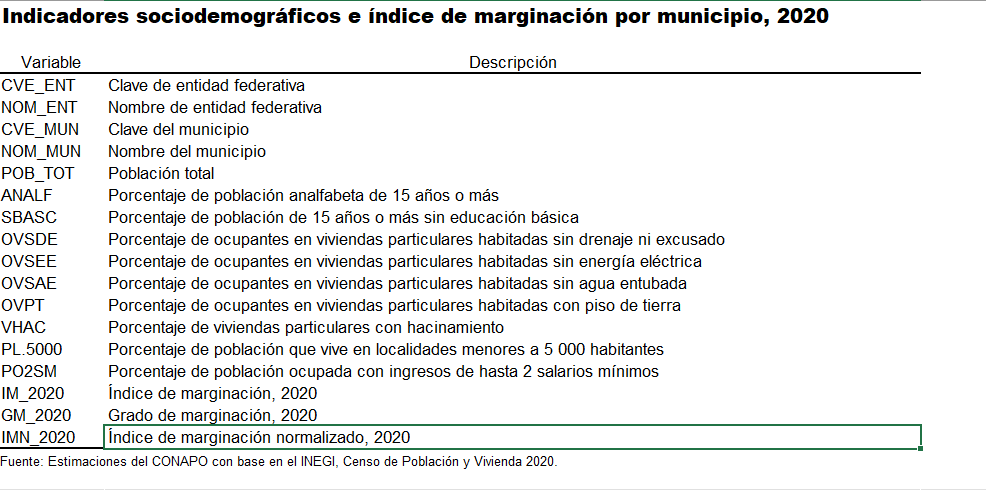

In [64]:
# Ruta de la imagen
imagen_path = 'indicadores.png'
# Mostrar la imagen
display(Image(filename=imagen_path))

In [65]:
# ¿Qué columnas tienen los datos?
data.columns

Index(['CVE_ENT', 'NOM_ENT', 'CVE_MUN', 'NOM_MUN', 'POB_TOT', 'ANALF', 'SBASC',
       'OVSDE', 'OVSEE', 'OVSAE', 'OVPT', 'VHAC', 'PL.5000', 'PO2SM',
       'IM_2020', 'GM_2020', 'IMN_2020'],
      dtype='object')

In [66]:
# ¿Qué tamaño tienen los datos?
data.shape

(2469, 17)

In [67]:
# ¿Hay valores nulos en los datos?
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2469 entries, 0 to 2468
Data columns (total 17 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   CVE_ENT   2469 non-null   int64  
 1   NOM_ENT   2469 non-null   object 
 2   CVE_MUN   2469 non-null   int64  
 3   NOM_MUN   2469 non-null   object 
 4   POB_TOT   2469 non-null   int64  
 5   ANALF     2469 non-null   float64
 6   SBASC     2469 non-null   float64
 7   OVSDE     2469 non-null   float64
 8   OVSEE     2469 non-null   float64
 9   OVSAE     2469 non-null   float64
 10  OVPT      2469 non-null   float64
 11  VHAC      2469 non-null   float64
 12  PL.5000   2469 non-null   float64
 13  PO2SM     2469 non-null   float64
 14  IM_2020   2469 non-null   float64
 15  GM_2020   2469 non-null   object 
 16  IMN_2020  2469 non-null   float64
dtypes: float64(11), int64(3), object(3)
memory usage: 328.0+ KB


In [68]:
# Lista de los 9 índices
indices = ['ANALF', 'SBASC', 'OVSDE', 'OVSEE', 'OVSAE', 'OVPT',  'VHAC', 'PL.5000', 'PO2SM']

In [69]:
# Base de datos con los 9 índices de marginación
data2 = data[indices]

In [70]:
# Mostrar datos
data2.head(5)

,ANALF,SBASC,OVSDE,OVSEE,OVSAE,OVPT,VHAC,PL.5000,PO2SM
0,1.644738,20.367220,0.104799,0.113169,0.378610,0.591434,10.339530,7.523683,54.226594
1,3.526405,33.906364,2.650373,0.486448,0.858160,1.352430,22.942305,78.221049,78.565471
2,4.491509,42.482450,0.365177,0.516760,0.800978,1.040411,19.219858,51.301288,79.259777
3,3.144867,27.696745,0.712855,0.577354,0.659833,1.030989,22.716866,65.470588,81.726369
4,2.380588,26.692477,0.277034,0.354957,0.860426,1.312652,16.404575,37.164143,56.748753


In [71]:
# Normalizar datos
data3 = (data2 - data2.min()) / (data2.max() - data2.min())
data_norm = pd.concat([data3, data[['NOM_ENT']]], axis = 1)
data_norm.head(10)

,ANALF,SBASC,OVSDE,OVSEE,OVSAE,OVPT,VHAC,PL.5000,PO2SM,NOM_ENT
0,0.024494,0.179147,0.001626,0.002133,0.004629,0.008678,0.097375,0.075237,0.360232,Aguascalientes
1,0.060188,0.342677,0.041123,0.009167,0.010492,0.019845,0.289451,0.782210,0.700413,Aguascalientes
2,0.078495,0.446262,0.005666,0.009738,0.009793,0.015267,0.232718,0.513013,0.710117,Aguascalientes
3,0.052950,0.267675,0.011061,0.010880,0.008068,0.015128,0.286015,0.654706,0.744592,Aguascalientes
4,0.038453,0.255545,0.004298,0.006689,0.010520,0.019261,0.189811,0.371641,0.395484,Aguascalientes
5,0.045125,0.243851,0.008399,0.008018,0.012774,0.010354,0.230525,0.327646,0.501516,Aguascalientes
6,0.058661,0.260399,0.014986,0.009448,0.012560,0.019115,0.259475,0.442852,0.673556,Aguascalientes
7,0.039575,0.276410,0.032694,0.017385,0.020893,0.012614,0.268578,0.413003,0.656322,Aguascalientes
8,0.073633,0.356928,0.021490,0.011030,0.013274,0.020979,0.290113,0.767623,0.677744,Aguascalientes
9,0.067244,0.352960,0.036014,0.019420,0.021780,0.021314,0.272297,0.697550,0.669253,Aguascalientes


In [72]:
# CreaR variables X (Índices), y (NOM_ENT)
X = data2.values
y = data['NOM_ENT'].values
Xnorm = data_norm.drop(['NOM_ENT'], axis = 1).values

In [73]:
print('Variables numéricas: \n', X)
print('Variables numéricas normalizadas: \n', Xnorm) 
print('Variables categórica: \n', y)

Variables numéricas: 
 [[  1.64473777  20.3672204    0.1047987  ...  10.33952999   7.52368307
   54.22659412]
 [  3.52640545  33.90636439   2.65037265 ...  22.94230461  78.22104936
   78.56547123]
 [  4.49150907  42.48244984   0.36517725 ...  19.21985817  51.30128755
   79.25977654]
 ...
 [  1.4424379   19.43622924   0.29473941 ...   9.34095764   7.46154926
   57.88530743]
 [  5.11910796  31.99258613   3.0661303  ...  23.54457664  16.78807138
   83.05613306]
 [  5.62622309  44.22617871   1.08774474 ...  17.94871712 100.
   79.01390645]]
Variables numéricas normalizadas: 
 [[0.02449442 0.17914672 0.00162604 ... 0.09737516 0.07523683 0.36023204]
 [0.06018763 0.3426769  0.04112266 ... 0.28945073 0.78221049 0.70041284]
 [0.0784946  0.44626164 0.00566602 ... 0.23271791 0.51301288 0.71011704]
 ...
 [0.02065701 0.16790191 0.00457312 ... 0.08215618 0.07461549 0.41136932]
 [0.09039948 0.31956166 0.04757347 ... 0.2986298  0.16788071 0.76317814]
 [0.10001891 0.46732297 0.01687723 ... 0.21334478 1

In [74]:
data_norm.groupby(['NOM_ENT']).std()

,ANALF,SBASC,OVSDE,OVSEE,OVSAE,OVPT,VHAC,PL.5000,PO2SM
NOM_ENT,,,,,,,,,
Aguascalientes,0.016879,0.072484,0.014298,0.004888,0.005453,0.004613,0.057136,0.214371,0.133218
Baja California,0.048726,0.111441,0.002139,0.037971,0.072500,0.016951,0.106311,0.181674,0.064464
Baja California Sur,0.021820,0.069527,0.005565,0.011612,0.038121,0.036084,0.073647,0.140733,0.130708
Campeche,0.052110,0.076500,0.041889,0.033909,0.088068,0.043843,0.091817,0.295229,0.134744
Chiapas,0.133151,0.139185,0.069335,0.032616,0.125517,0.116264,0.141160,0.254839,0.084313
Chihuahua,0.161047,0.180088,0.160920,0.198063,0.098348,0.173547,0.139281,0.367767,0.162269
Ciudad de México,0.010812,0.055955,0.001653,0.001481,0.040607,0.011528,0.078912,0.060460,0.154879
Coahuila de Zaragoza,0.027534,0.097764,0.010169,0.013448,0.026055,0.007918,0.047497,0.430918,0.173414
Colima,0.042638,0.114002,0.006735,0.007101,0.008090,0.032176,0.065525,0.295323,0.141696


In [75]:
# ¿Cómo se dist. las variables numéricas?
data_norm.groupby(['NOM_ENT']).mean()

,ANALF,SBASC,OVSDE,OVSEE,OVSAE,OVPT,VHAC,PL.5000,PO2SM
NOM_ENT,,,,,,,,,
Aguascalientes,0.052442,0.296257,0.016386,0.009992,0.011851,0.015760,0.239838,0.496062,0.601111
Baja California,0.048550,0.286648,0.004734,0.027962,0.064114,0.033870,0.198552,0.195379,0.619132
Baja California Sur,0.047754,0.261154,0.010108,0.022329,0.046452,0.059971,0.224080,0.163751,0.332089
Campeche,0.148670,0.353917,0.068370,0.028835,0.076633,0.051169,0.465364,0.491365,0.720285
Chiapas,0.304434,0.585865,0.044116,0.033154,0.128527,0.198726,0.566944,0.752567,0.874916
Chihuahua,0.135198,0.530076,0.080901,0.104582,0.050085,0.089462,0.184057,0.748744,0.633076
Ciudad de México,0.020265,0.140290,0.001140,0.001254,0.022694,0.011420,0.163340,0.023101,0.379303
Coahuila de Zaragoza,0.047759,0.300547,0.011150,0.008890,0.019598,0.011238,0.190730,0.469946,0.590340
Colima,0.080370,0.344075,0.009285,0.010746,0.013326,0.054605,0.210966,0.336648,0.538896


<AxesSubplot:xlabel='NOM_ENT', ylabel='count'>

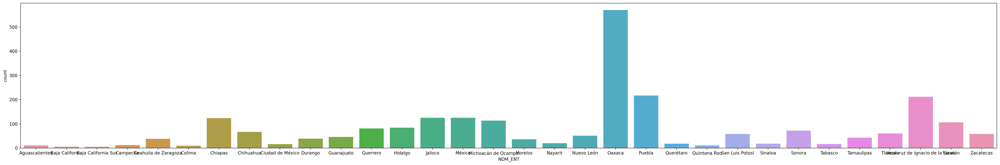

In [77]:
# ¿Desbalanceo de clases?
f, ax = plt.subplots(figsize=(40, 6))
sns.countplot(data = data_norm, x = 'NOM_ENT', orient="h")

<AxesSubplot:xlabel='ANALF', ylabel='NOM_ENT'>

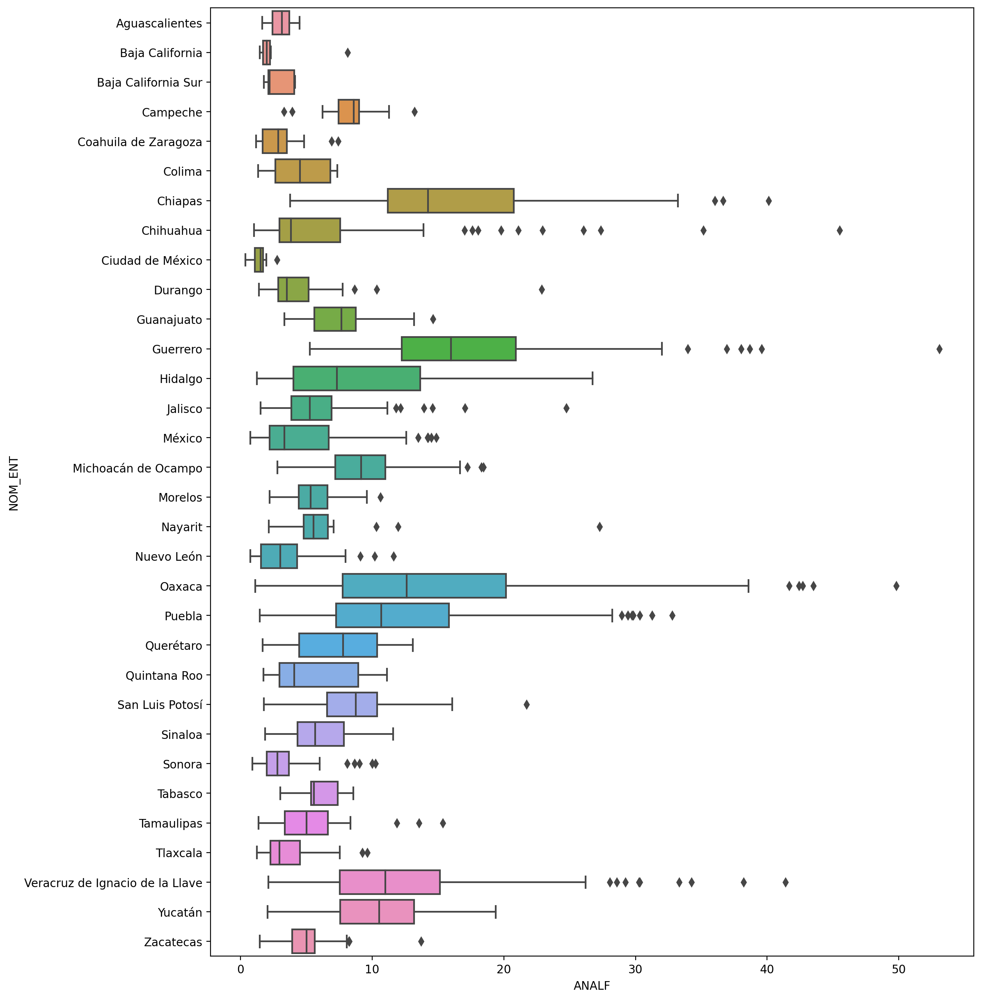

In [78]:
# Distribución de los datos
f, ax = plt.subplots(figsize=(12, 15))
sns.boxplot(data=data, orient="h", y = "NOM_ENT", x = "ANALF")

<AxesSubplot:xlabel='IMN_2020', ylabel='NOM_ENT'>

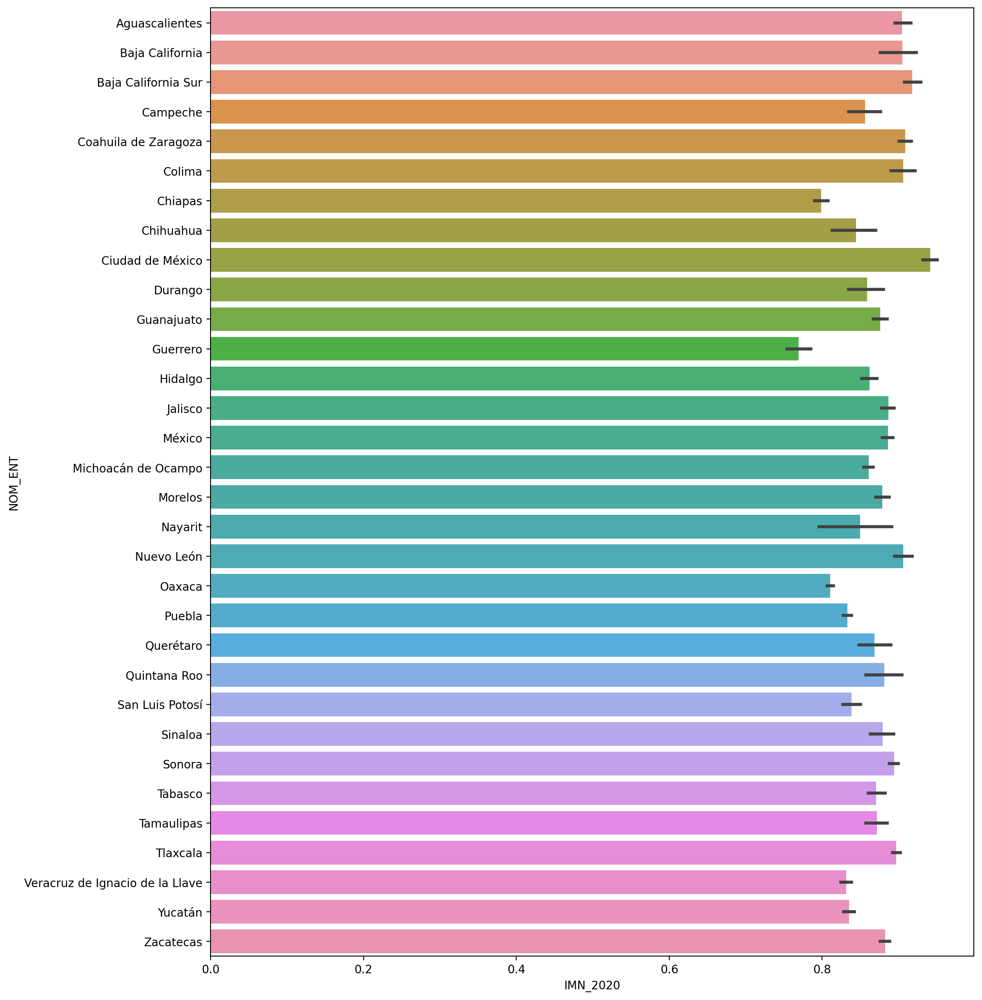

In [79]:
# IMN_2020 en los distintos Estados
f, ax = plt.subplots(figsize=(12, 15))
sns.barplot(data=data, orient="h", y = "NOM_ENT", x = "IMN_2020")

Matriz de varianzas y covarianzas muestrales S:
\begin{align}
S & = \dfrac{1}{n} X^{'} P X \\
P & = I - \dfrac{1}{n} 1 1^{'} 
\end{align}

In [83]:
n = data_norm.shape[0]
I = np.eye(n)
one = np.ones((n,1))
P = I - (1/n) * one @ one.T
S = (1/n) * X.T @ P @ X

In [84]:
I

array([[1., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 0., 1.]])

In [85]:
print('Matriz de centrado P: \n', P)
print('\n')
print('Matriz de varianzas y covarianzas muestrales: \n', S)
print('\n')
print('Shape of P: \n', P.shape)
print('\n')
print('Shape of S: \n', S.shape)

Matriz de centrado P: 
 [[ 9.99594978e-01 -4.05022276e-04 -4.05022276e-04 ... -4.05022276e-04
  -4.05022276e-04 -4.05022276e-04]
 [-4.05022276e-04  9.99594978e-01 -4.05022276e-04 ... -4.05022276e-04
  -4.05022276e-04 -4.05022276e-04]
 [-4.05022276e-04 -4.05022276e-04  9.99594978e-01 ... -4.05022276e-04
  -4.05022276e-04 -4.05022276e-04]
 ...
 [-4.05022276e-04 -4.05022276e-04 -4.05022276e-04 ...  9.99594978e-01
  -4.05022276e-04 -4.05022276e-04]
 [-4.05022276e-04 -4.05022276e-04 -4.05022276e-04 ... -4.05022276e-04
   9.99594978e-01 -4.05022276e-04]
 [-4.05022276e-04 -4.05022276e-04 -4.05022276e-04 ... -4.05022276e-04
  -4.05022276e-04  9.99594978e-01]]


Matriz de varianzas y covarianzas muestrales: 
 [[  58.24874491   83.11489532   14.0266839     7.4277639    25.44411812
    44.16256351   53.19687385  120.91850515   55.97004617]
 [  83.11489532  195.40578586   19.17091397   11.4913037    34.86678156
    68.73430269   77.08755987  295.02389421  116.1107744 ]
 [  14.0266839    19.1709139

\begin{equation}
R = D^{-1/2} S D^{-1/2}
\end{equation}

In [87]:
D_root

array([[0.13102577, 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.07153709, 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.18909927, 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.36119257, 0.        ,
        0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.10817685,
        0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.11146068, 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.09447871, 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.02836028, 0.        ],


In [88]:
D_root = np.diag(pow(np.diag(S), -0.5))
R = D_root @ S @ D_root
print('Matriz de correlación: \n', R)

Matriz de correlación: 
 [[1.         0.77905275 0.34753743 0.35152289 0.36064378 0.64495987
  0.65853182 0.44932439 0.62001089]
 [0.77905275 1.         0.2593367  0.29691997 0.26982208 0.548058
  0.52101417 0.59854802 0.70224839]
 [0.34753743 0.2593367  1.         0.52974607 0.21927828 0.2792225
  0.3740015  0.20520026 0.20417394]
 [0.35152289 0.29691997 0.52974607 1.         0.3437227  0.50131864
  0.3081391  0.23106584 0.19773284]
 [0.36064378 0.26982208 0.21927828 0.3437227  1.         0.39105559
  0.31965038 0.18961717 0.27607441]
 [0.64495987 0.548058   0.2792225  0.50131864 0.39105559 1.
  0.61518433 0.33856788 0.4776667 ]
 [0.65853182 0.52101417 0.3740015  0.3081391  0.31965038 0.61518433
  1.         0.26903556 0.58060071]
 [0.44932439 0.59854802 0.20520026 0.23106584 0.18961717 0.33856788
  0.26903556 1.         0.57501754]
 [0.62001089 0.70224839 0.20417394 0.19773284 0.27607441 0.4776667
  0.58060071 0.57501754 1.        ]]


<AxesSubplot:>

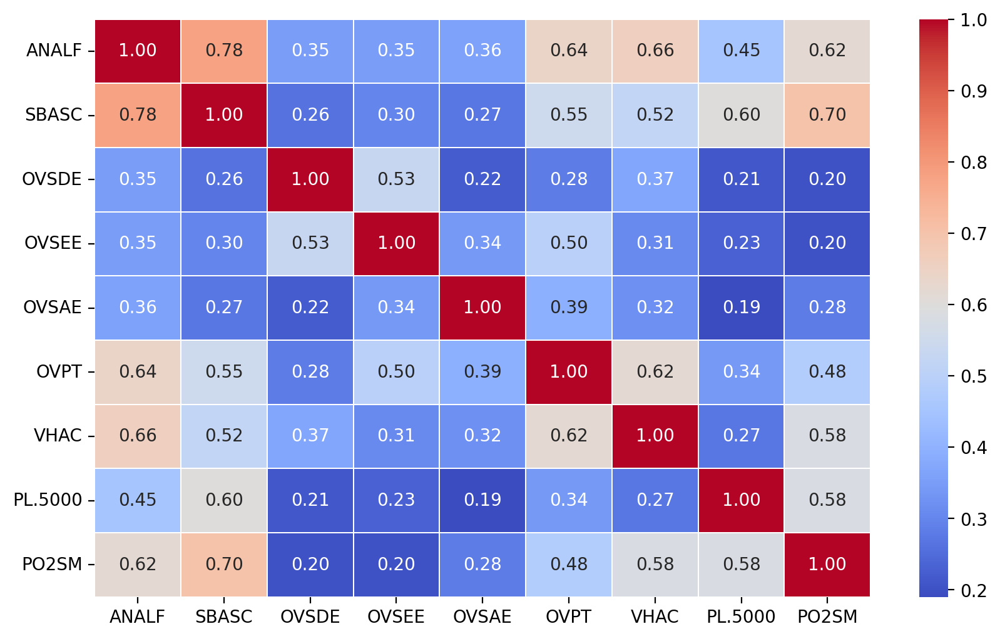

In [89]:
# Mapa de calor de la matriz de correlación
f, ax = plt.subplots(figsize=(10, 6))
CorrData2 = data2.corr()
sns.heatmap(round(CorrData2,2), annot=True, ax=ax, cmap="coolwarm",fmt='.2f', linewidths=.05)

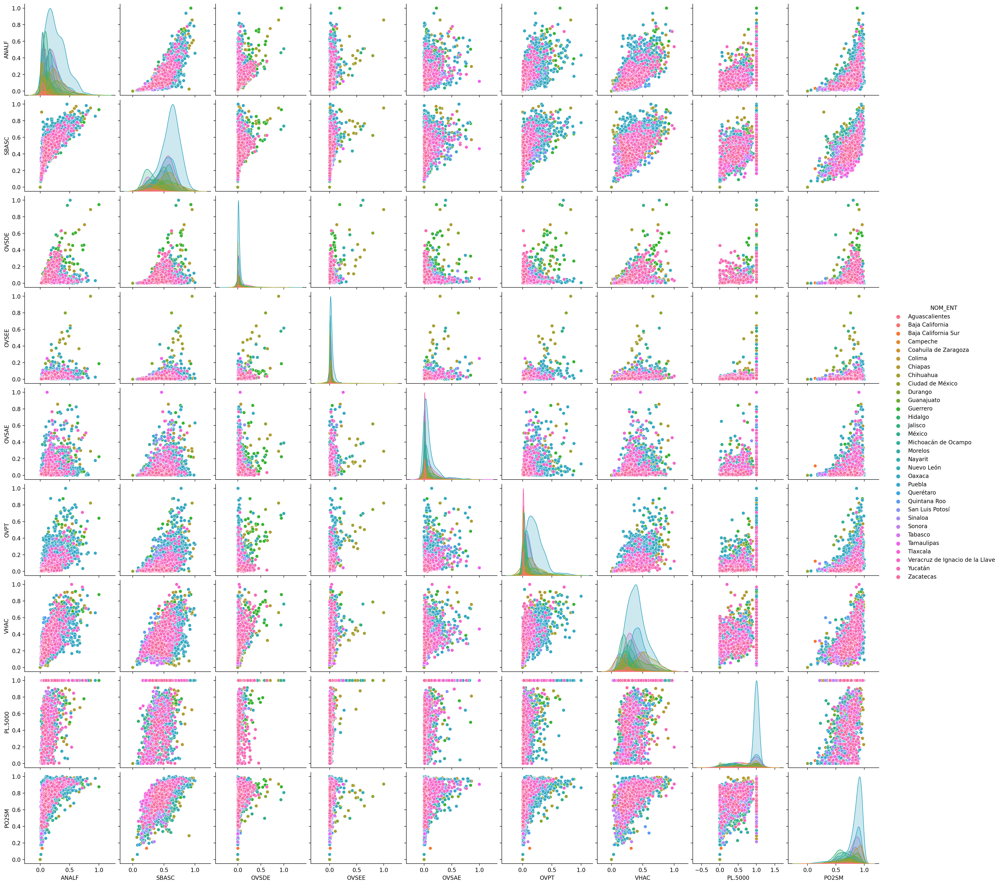

In [26]:
# Pairplot: Todos vs todos
sns.pairplot(data = data_norm, hue = 'NOM_ENT')

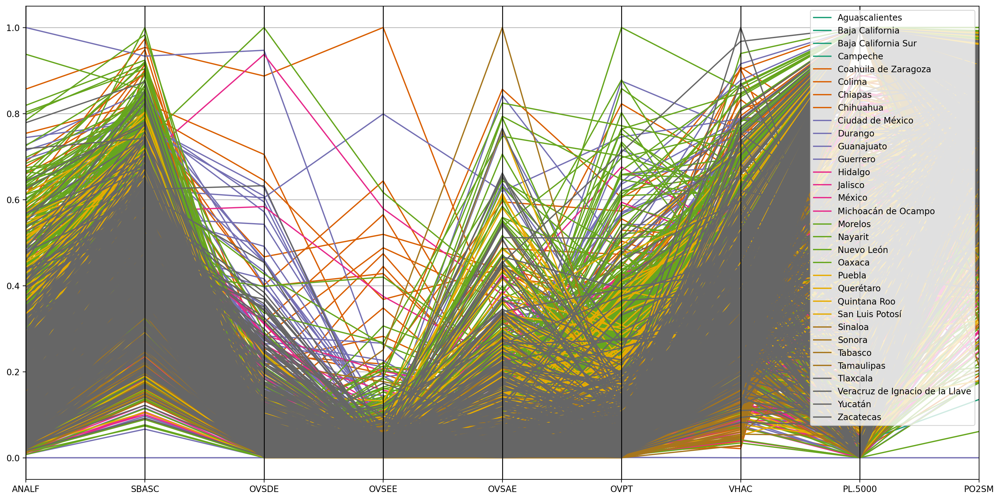

In [27]:
# Coordenadas paralelas
f, ax = plt.subplots(figsize=(20, 10))
pc = parallel_coordinates(frame = data_norm, class_column = 'NOM_ENT',colormap=plt.get_cmap("Dark2"))

### Step 2 PCA (Forma 1)

In [90]:
# versión de la libreria
# pip install pca
import pca 
print(pca.__version__)

1.8.6


In [91]:
# pip install pca
from pca import pca  # Llamamos a la libreria de PCA

In [92]:
# Indexar la variable NOM_ENT
data_norm_index = data_norm.set_index('NOM_ENT')
data_norm_index

,ANALF,SBASC,OVSDE,OVSEE,OVSAE,OVPT,VHAC,PL.5000,PO2SM
NOM_ENT,,,,,,,,,
Aguascalientes,0.024494,0.179147,0.001626,0.002133,0.004629,0.008678,0.097375,0.075237,0.360232
Aguascalientes,0.060188,0.342677,0.041123,0.009167,0.010492,0.019845,0.289451,0.782210,0.700413
Aguascalientes,0.078495,0.446262,0.005666,0.009738,0.009793,0.015267,0.232718,0.513013,0.710117
Aguascalientes,0.052950,0.267675,0.011061,0.010880,0.008068,0.015128,0.286015,0.654706,0.744592
Aguascalientes,0.038453,0.255545,0.004298,0.006689,0.010520,0.019261,0.189811,0.371641,0.395484
...,...,...,...,...,...,...,...,...,...
Zacatecas,0.135522,0.376156,0.046715,0.008535,0.027562,0.016690,0.274060,1.000000,0.872491
Zacatecas,0.072960,0.474332,0.039356,0.010388,0.013130,0.013139,0.172513,0.567748,0.747195
Zacatecas,0.020657,0.167902,0.004573,0.003077,0.015633,0.007109,0.082156,0.074615,0.411369


In [93]:
# Inicializar el modelo: 2 Componentes
model_1 = pca(n_components=2, normalize = True)

In [94]:
# Ajuste del modelo
out = model_1.fit_transform(data_norm_index)

[pca] >Processing dataframe..
[pca] >Normalizing input data per feature (zero mean and unit variance)..
[pca] >The PCA reduction is performed on the [9] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[2]
[pca] >Outlier detection using SPE/DmodX with n_std=[2]


[pca] >Plot PC1 vs PC2 with loadings.


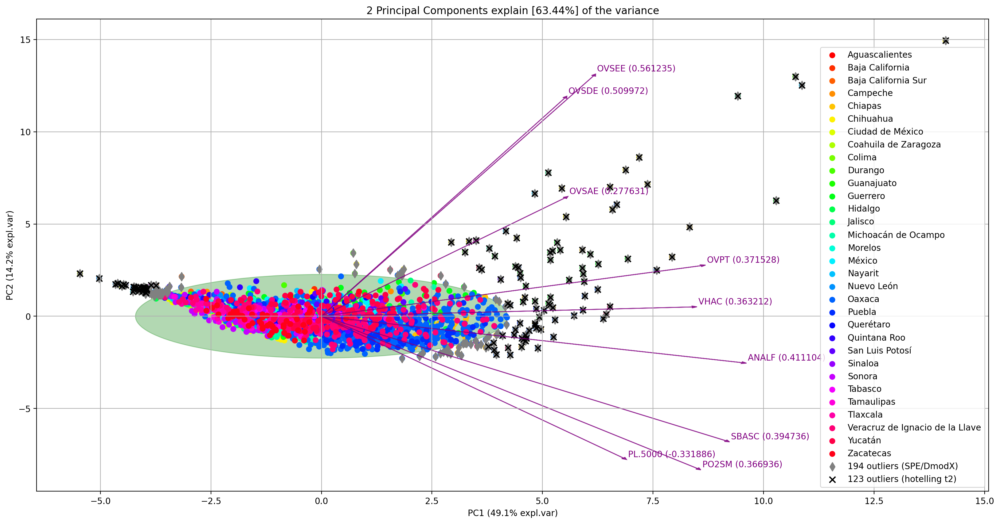

In [100]:
# Outlier detection
fig, ax = model_1.biplot(SPE=True, hotellingt2=True, figsize=(20, 10), label=False, legend=True,s = 25,
                         cmap="hsv",
                         fontdict={'size':10, 'weight':'normal'}, color_arrow='purple')

In [96]:
# Inicializar el modelo: 3 Componentes
model_2 = pca(n_components=3, normalize = True)

In [97]:
# Ajuste del modelo
out = model_2.fit_transform(data_norm_index)

[pca] >Processing dataframe..
[pca] >Normalizing input data per feature (zero mean and unit variance)..
[pca] >The PCA reduction is performed on the [9] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[3]
[pca] >Outlier detection using SPE/DmodX with n_std=[2]


[pca] >Plot PC1 vs PC2 vs PC3 with loadings.


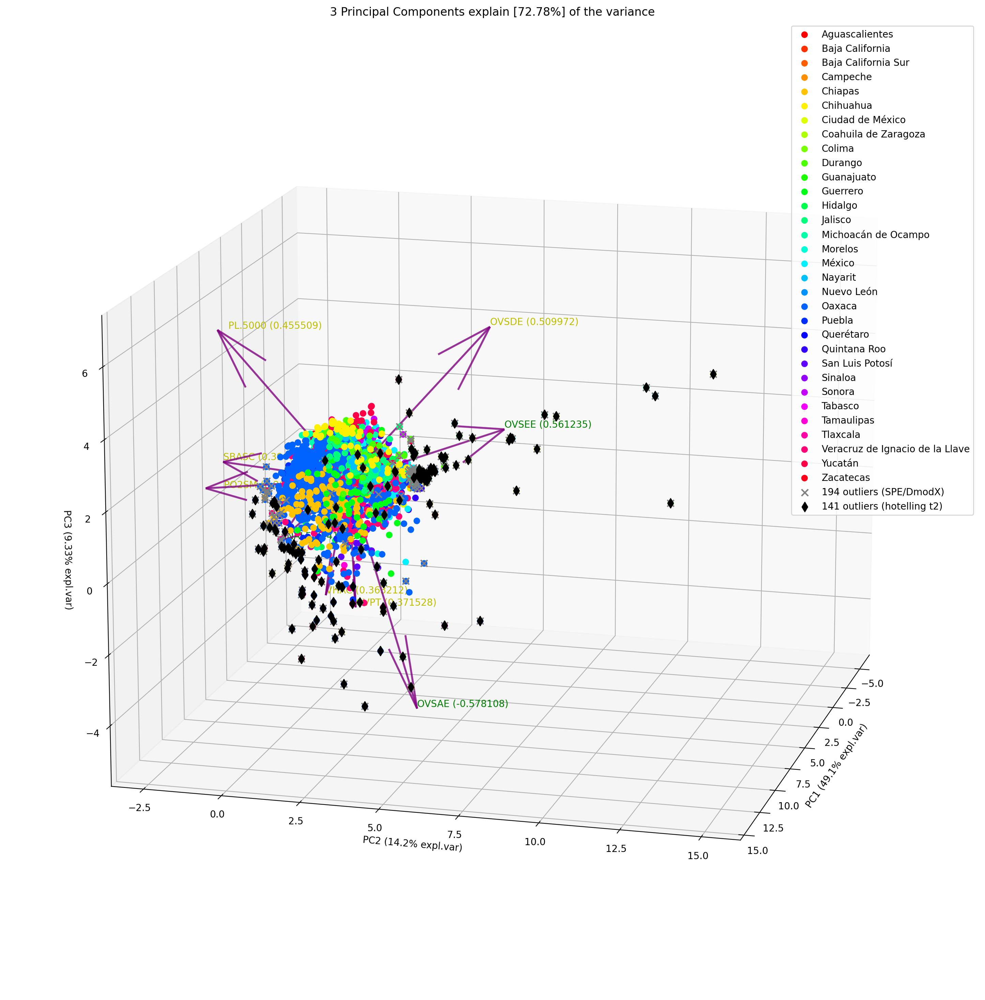

In [98]:
# Outlier detection
fig, ax = model_2.biplot3d(SPE=True,
                         hotellingt2=True,
                         figsize=(15, 15),
                         label=False,
                         legend=True,
                         s = 25,
                         cmap="hsv",
                         fontdict={'size':10, 'weight':'normal'}, color_arrow='purple')
ax.view_init(15,15)

### Step 3 PCA (Forma 2)

In [101]:
# Paso 1: Calculamos la matriz estandarizada (a mano)
X_std = P@X@D_root
# O bien con la librería
X_std2 = StandardScaler().fit_transform(X)
print('Matriz estandarizada: \n', X_std)
print('Matriz estandarizada: \n', X_std2)
print(X_std.shape)

Matriz estandarizada: 
 [[-1.11630399 -1.82318042 -0.57772927 ... -1.53308294 -1.7690231
  -2.36025935]
 [-0.86975703 -0.85462942 -0.09636308 ... -0.34238908  0.23597399
  -0.30253367]
 [-0.74330359 -0.24112119 -0.52849187 ... -0.69408101 -0.52747799
  -0.24383376]
 ...
 [-1.14281048 -1.88978083 -0.54181162 ... -1.62742676 -1.77078524
  -2.05093414]
 [-0.66107197 -0.99153555 -0.01774361 ... -0.2854872  -1.50628246
   0.07712847]
 [-0.59462682 -0.1163799  -0.39185488 ... -0.81417677  0.85363113
  -0.2646208 ]]
Matriz estandarizada: 
 [[-1.11630399 -1.82318042 -0.57772927 ... -1.53308294 -1.7690231
  -2.36025935]
 [-0.86975703 -0.85462942 -0.09636308 ... -0.34238908  0.23597399
  -0.30253367]
 [-0.74330359 -0.24112119 -0.52849187 ... -0.69408101 -0.52747799
  -0.24383376]
 ...
 [-1.14281048 -1.88978083 -0.54181162 ... -1.62742676 -1.77078524
  -2.05093414]
 [-0.66107197 -0.99153555 -0.01774361 ... -0.2854872  -1.50628246
   0.07712847]
 [-0.59462682 -0.1163799  -0.39185488 ... -0.8141767

In [102]:
# Paso 2: Valores y vectores propios

# Vector de medias de la matriz estandarizada
mean_vect = np.mean(X_std, axis = 0)
mean_vect

array([-1.16598149e-16, -3.59332968e-16, -1.62171703e-16,  1.14866939e-16,
        3.53436734e-17, -8.35477675e-17, -1.39800866e-16, -2.33506567e-15,
        4.09577417e-16])

In [103]:
# Matriz de covarianzas de la matriz estandarizada
cov_matrix =   np.cov(X_std.T)
print("La matriz de covarianzas es : \n", cov_matrix)

La matriz de covarianzas es : 
 [[1.00040519 0.77936841 0.34767825 0.35166533 0.36078991 0.6452212
  0.65879865 0.44950645 0.62026211]
 [0.77936841 1.00040519 0.25944178 0.29704027 0.26993141 0.54828007
  0.52122527 0.59879054 0.70253293]
 [0.34767825 0.25944178 1.00040519 0.52996072 0.21936713 0.27933563
  0.37415304 0.2052834  0.20425667]
 [0.35166533 0.29704027 0.52996072 1.00040519 0.34386197 0.50152177
  0.30826395 0.23115947 0.19781296]
 [0.36078991 0.26993141 0.21936713 0.34386197 1.00040519 0.39121404
  0.3197799  0.189694   0.27618627]
 [0.6452212  0.54828007 0.27933563 0.50152177 0.39121404 1.00040519
  0.6154336  0.33870506 0.47786024]
 [0.65879865 0.52122527 0.37415304 0.30826395 0.3197799  0.6154336
  1.00040519 0.26914457 0.58083596]
 [0.44950645 0.59879054 0.2052834  0.23115947 0.189694   0.33870506
  0.26914457 1.00040519 0.57525053]
 [0.62026211 0.70253293 0.20425667 0.19781296 0.27618627 0.47786024
  0.58083596 0.57525053 1.00040519]]


In [40]:
eig_values, eig_vectors = np.linalg.eig(cov_matrix)
print("Valores propios: \n%s" %eig_values)
print("Vectores propios: \n%s" %eig_vectors)

Valores propios: 
[4.42699645 1.28577552 0.84082833 0.74452713 0.16719857 0.2471826
 0.39862677 0.3258981  0.5666132 ]
Vectores propios: 
[[-0.4111035  -0.10865862 -0.09336208 -0.18363743  0.65317935 -0.19338212
   0.55128003  0.09365229 -0.00526329]
 [-0.39473629 -0.29106027  0.11140273  0.01970922 -0.67407634  0.0093219
   0.5053653  -0.17886519 -0.06939388]
 [-0.23737364  0.50997219  0.49925979 -0.17018871 -0.03731874  0.32764019
   0.08391468  0.18495531  0.50533817]
 [-0.26518807  0.56123539  0.22674977  0.16745698  0.05073149 -0.31520284
  -0.0913661  -0.45179807 -0.46993302]
 [-0.23841322  0.27763068 -0.57810787  0.62484238 -0.06010028 -0.00085207
   0.05678884  0.02814482  0.36580562]
 [-0.37152764  0.1185759  -0.27306749 -0.14013602 -0.05153516  0.53240713
  -0.17018516  0.39019241 -0.53514175]
 [-0.36321228  0.02188075 -0.24723529 -0.50181999 -0.22161446 -0.51973666
  -0.41199313  0.1111503   0.23090603]
 [-0.29507123 -0.33188566  0.45550891  0.49694007  0.07236577 -0.2321775

In [104]:
# Junta los los valores propios con su respectivo vector propio
eigen_pairs = []

for i in range(len(eig_values)):
    value = np.abs(eig_values[i])
    vector = eig_vectors[:, i]
    eigen_pairs.append((value, vector))

In [105]:
eigen_pairs

[(4.4269964468625425,
  array([-0.4111035 , -0.39473629, -0.23737364, -0.26518807, -0.23841322,
         -0.37152764, -0.36321228, -0.29507123, -0.36693648])),
 (1.285775515335189,
  array([-0.10865862, -0.29106027,  0.50997219,  0.56123539,  0.27763068,
          0.1185759 ,  0.02188075, -0.33188566, -0.35588556])),
 (0.8408283320685344,
  array([-0.09336208,  0.11140273,  0.49925979,  0.22674977, -0.57810787,
         -0.27306749, -0.24723529,  0.45550891,  0.02844178])),
 (0.7445271349660509,
  array([-0.18363743,  0.01970922, -0.17018871,  0.16745698,  0.62484238,
         -0.14013602, -0.50181999,  0.49694007,  0.00663044])),
 (0.1671985724056491,
  array([ 0.65317935, -0.67407634, -0.03731874,  0.05073149, -0.06010028,
         -0.05153516, -0.22161446,  0.07236577,  0.23322469])),
 (0.2471826049847722,
  array([-0.19338212,  0.0093219 ,  0.32764019, -0.31520284, -0.00085207,
          0.53240713, -0.51973666, -0.23217759,  0.38512962])),
 (0.3986267709605049,
  array([ 0.5512800

In [106]:
# Los ordenamos en forma descendente
eigen_pairs.sort(reverse = True)
eigen_pairs

[(4.4269964468625425,
  array([-0.4111035 , -0.39473629, -0.23737364, -0.26518807, -0.23841322,
         -0.37152764, -0.36321228, -0.29507123, -0.36693648])),
 (1.285775515335189,
  array([-0.10865862, -0.29106027,  0.50997219,  0.56123539,  0.27763068,
          0.1185759 ,  0.02188075, -0.33188566, -0.35588556])),
 (0.8408283320685344,
  array([-0.09336208,  0.11140273,  0.49925979,  0.22674977, -0.57810787,
         -0.27306749, -0.24723529,  0.45550891,  0.02844178])),
 (0.7445271349660509,
  array([-0.18363743,  0.01970922, -0.17018871,  0.16745698,  0.62484238,
         -0.14013602, -0.50181999,  0.49694007,  0.00663044])),
 (0.5666131961928057,
  array([-0.00526329, -0.06939388,  0.50533817, -0.46993302,  0.36580562,
         -0.53514175,  0.23090603, -0.04823411,  0.20764998])),
 (0.3986267709605049,
  array([ 0.55128003,  0.5053653 ,  0.08391468, -0.0913661 ,  0.05678884,
         -0.17018516, -0.41199313, -0.28722647, -0.3753418 ])),
 (0.3258981036955811,
  array([ 0.0936522

In [107]:
for ep in eigen_pairs:
    print(ep[0])

4.4269964468625425
1.285775515335189
0.8408283320685344
0.7445271349660509
0.5666131961928057
0.3986267709605049
0.3258981036955811
0.2471826049847722
0.1671985724056491


In [108]:
# Varianza explicativa: Nos dice cuanta varianza se le atribuye a c/u de las componentes principales
var_exp = []
total_sum = sum(eig_values)

for value in sorted(eig_values, reverse=True):
    var_exp.append((value / total_sum) * 100)

print('Varianza explicativa: \n', var_exp)
print(total_sum)

Varianza explicativa: 
 [49.168926829831086, 14.280608306769496, 9.338753087372957, 8.269173165457069, 6.293152280292722, 4.42739242487074, 3.619623418931168, 2.7453610058162026, 1.8570094806585766]
9.003646677471629


In [109]:
# Varianza explicativa acumulada
cum_var_exp = np.cumsum(var_exp)
cum_var_exp

array([ 49.16892683,  63.44953514,  72.78828822,  81.05746139,
        87.35061367,  91.77800609,  95.39762951,  98.14299052,
       100.        ])

In [110]:
# W es la matriz de proyecciones: De cada eigenvalor toma el eigenvector asociado
W = np.hstack((eigen_pairs[0][1].reshape(9,1),
             eigen_pairs[1][1].reshape(9,1)))
print('Matriz de proyección: \n', W)
print(W.shape)

Matriz de proyección: 
 [[-0.4111035  -0.10865862]
 [-0.39473629 -0.29106027]
 [-0.23737364  0.50997219]
 [-0.26518807  0.56123539]
 [-0.23841322  0.27763068]
 [-0.37152764  0.1185759 ]
 [-0.36321228  0.02188075]
 [-0.29507123 -0.33188566]
 [-0.36693648 -0.35588556]]
(9, 2)


In [48]:
eigen_pairs

[(4.4269964468625425,
  array([-0.4111035 , -0.39473629, -0.23737364, -0.26518807, -0.23841322,
         -0.37152764, -0.36321228, -0.29507123, -0.36693648])),
 (1.285775515335189,
  array([-0.10865862, -0.29106027,  0.50997219,  0.56123539,  0.27763068,
          0.1185759 ,  0.02188075, -0.33188566, -0.35588556])),
 (0.8408283320685344,
  array([-0.09336208,  0.11140273,  0.49925979,  0.22674977, -0.57810787,
         -0.27306749, -0.24723529,  0.45550891,  0.02844178])),
 (0.7445271349660509,
  array([-0.18363743,  0.01970922, -0.17018871,  0.16745698,  0.62484238,
         -0.14013602, -0.50181999,  0.49694007,  0.00663044])),
 (0.5666131961928057,
  array([-0.00526329, -0.06939388,  0.50533817, -0.46993302,  0.36580562,
         -0.53514175,  0.23090603, -0.04823411,  0.20764998])),
 (0.3986267709605049,
  array([ 0.55128003,  0.5053653 ,  0.08391468, -0.0913661 ,  0.05678884,
         -0.17018516, -0.41199313, -0.28722647, -0.3753418 ])),
 (0.3258981036955811,
  array([ 0.0936522

In [49]:
eigen_pairs[0][1]

array([-0.4111035 , -0.39473629, -0.23737364, -0.26518807, -0.23841322,
       -0.37152764, -0.36321228, -0.29507123, -0.36693648])

In [50]:
X_std.shape

(2469, 9)

In [111]:
# Matriz PCA
Y = np.dot(X_std,W)
print(Y)
print(Y.shape)

[[ 3.84782195  1.19946162]
 [ 1.39109808 -0.13531355]
 [ 1.54247928 -0.32289867]
 ...
 [ 3.77418494  1.16425496]
 [ 1.64217114  0.42915364]
 [ 1.02933734 -0.76900196]]
(2469, 2)


In [112]:
# Matriz PCA normalizada
Y_norm = (Y - np.min(Y)) / (np.max(Y) - np.min(Y))
Y_norm

array([[0.61831515, 0.52716252],
       [0.53375837, 0.48122155],
       [0.53896868, 0.47476515],
       ...,
       [0.61578067, 0.52595076],
       [0.54239993, 0.50064967],
       [0.5213071 , 0.45941094]])

In [113]:
Y_names = np.hstack((Y[:,0].reshape(2469,1),
                Y[:,1].reshape(2469,1),
               y.reshape(2469,1)))
Y_names.reshape(2469,3)

array([[3.847821945912359, 1.1994616219367158, 'Aguascalientes'],
       [1.3910980804791253, -0.1353135453712308, 'Aguascalientes'],
       [1.5424792807103198, -0.3228986675365685, 'Aguascalientes'],
       ...,
       [3.7741849362216953, 1.1642549584967363, 'Zacatecas'],
       [1.6421711379302673, 0.42915363897654046, 'Zacatecas'],
       [1.0293373388205123, -0.7690019615987286, 'Zacatecas']],
      dtype=object)

In [114]:
PCA_manual = pd.DataFrame(Y_names, columns = ["PC1", "PC2", "NOM_ENT"])
PCA_manual

,PC1,PC2,NOM_ENT
0,3.847822,1.199462,Aguascalientes
1,1.391098,-0.135314,Aguascalientes
2,1.542479,-0.322899,Aguascalientes
3,1.700064,-0.154769,Aguascalientes
4,3.021976,0.804573,Aguascalientes
...,...,...,...
2464,0.529294,-0.760038,Zacatecas
2465,1.398222,-0.283976,Zacatecas
2466,3.774185,1.164255,Zacatecas
2467,1.642171,0.429154,Zacatecas


<AxesSubplot:xlabel='PC1', ylabel='PC2'>

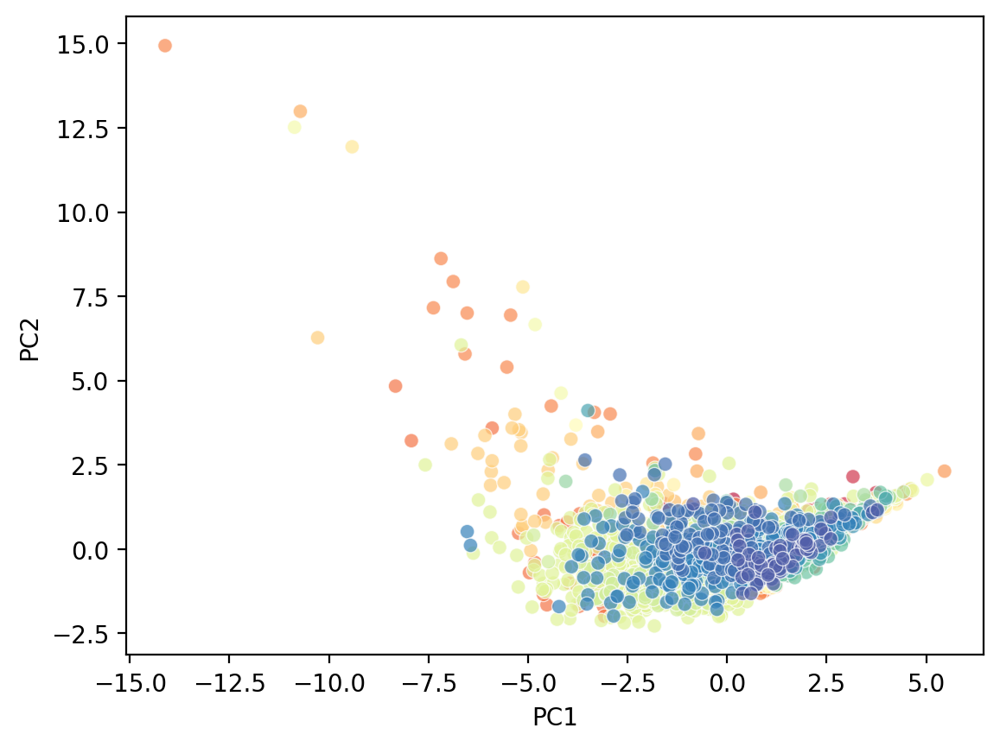

In [115]:
sns.scatterplot(data = PCA_manual, x = "PC1", y = "PC2",  hue = "NOM_ENT", alpha = 0.7, palette="Spectral", legend = False)

1 b) Construye un IM alternativo tomando el primer componente principal que obtuviste con PCA (el indicador debe estar en [0, 1] preferentemente). Compáralo con el de CONAPO y describe tus hallazgos al respecto. ¿Qué tanto cambia el resultado si tomas el segundo o tercer componente principal? ¿tendría algún sentido hacerlo?

In [56]:
PCA_norm = pd.DataFrame(Y_norm, columns = ["PC1", "PC2"])
PCA_norm

,PC1,PC2
0,0.618315,0.527163
1,0.533758,0.481222
2,0.538969,0.474765
3,0.544393,0.480552
4,0.589891,0.513571
...,...,...
2464,0.504096,0.459719
2465,0.534004,0.476105
2466,0.615781,0.525951
2467,0.542400,0.500650


In [57]:
# Índice IMN_2020
IMN_2020 = data['IMN_2020']
IMN_2020

0       0.944508
1       0.885433
2       0.893453
3       0.894326
4       0.924042
          ...   
2464    0.861915
2465    0.888580
2466    0.942275
2467    0.891884
2468    0.877756
Name: IMN_2020, Length: 2469, dtype: float64

In [58]:
data_IM = pd.concat([PCA_norm, IMN_2020], axis=1)
data_IM.columns = ['PC1','PC2','IMN_2020']

<AxesSubplot:>

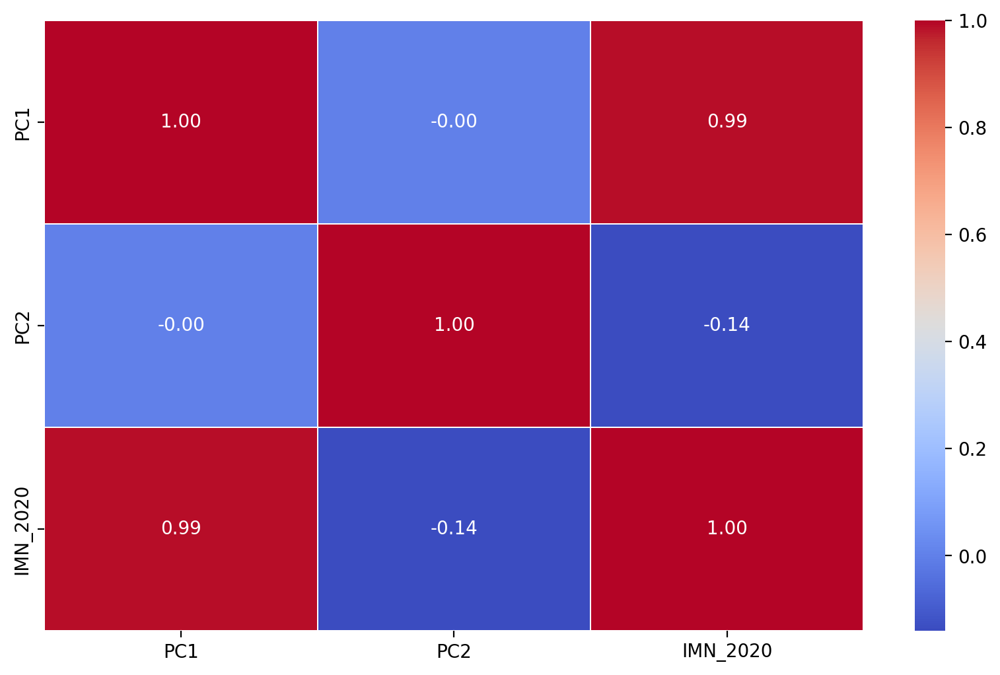

In [59]:
f, ax = plt.subplots(figsize=(10, 6))
CorrDataIM = data_IM.corr()
sns.heatmap(round(CorrDataIM,2), annot=True, ax=ax, cmap="coolwarm",fmt='.2f', linewidths=.05)

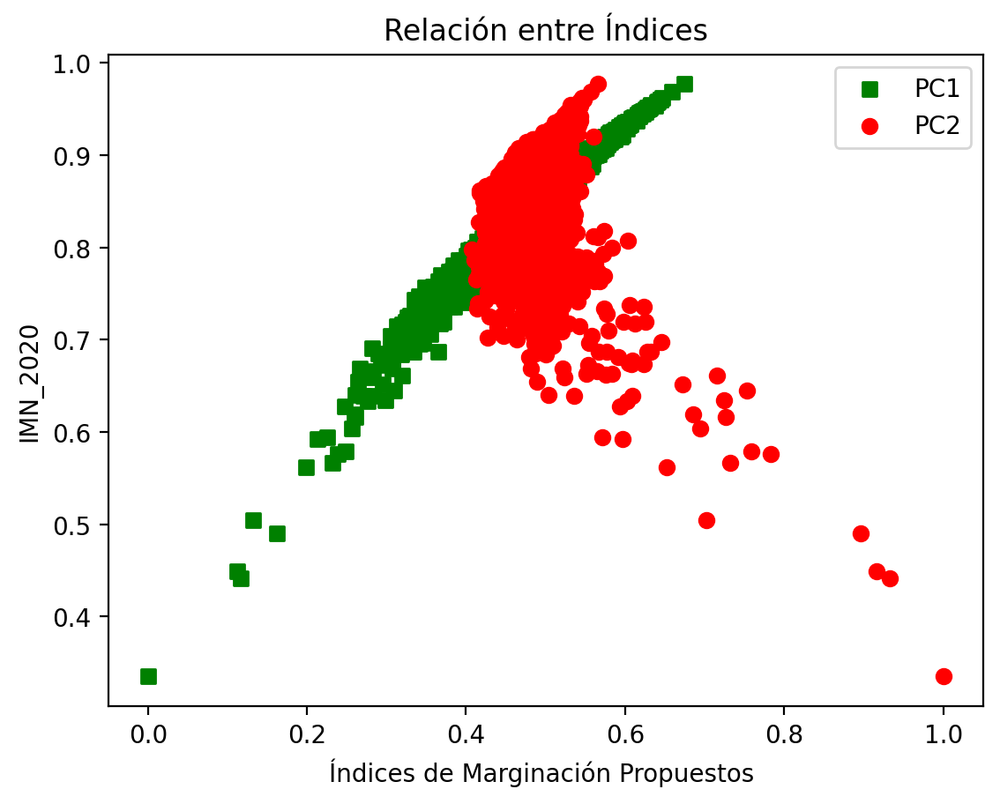

In [60]:
plt.scatter(x = data_IM["PC1"], y = data_IM['IMN_2020'], marker = "s", c = "green", label = "PC1" )
plt.scatter(x = data_IM["PC2"], y = data_IM['IMN_2020'],  marker = "o", c = "red", label = "PC2" )
plt.xlabel("Índices de Marginación Propuestos ")
plt.ylabel("IMN_2020")
plt.title("Relación entre Índices")
plt.legend()